# Final Notebook

## Motivation

- What is your dataset?

We choose a New York Collisions data set and a Historical Weather Data set.


- Why did you choose this/these particular dataset(s)?

The New York Collisions data set was choosen after we found out that our original data set (Copenhagen Collisions) had too many flaws. The New York data set was in the same category of investigation with traffic collisions, but was way better structured and was more complete. We choose to combine this with a weather data set because we have seen before that there is a correlation between bad driving and rainy days.
The point of choosing these data sets is to investigate what conditions make a severe collisions where people are injured, so that in the future someone may have looked at our website and avoided a severe collision. 


- What was your goal for the end user's experience?

The end user experience should be that of a simple github website that is easy to understand and gives simple but important information to the user, while having a nice design and structure. Hopefully the choosen subject and the way it is presented is compelling to the user and makes them remember the information provided. 



## Basic stats

Write about your choices in data cleaning and preprocessing.

Write a short section that discusses the dataset stats, containing key points/plots from your exploratory data analysis.

We start by cleaning our data and adding some important columns

In [218]:
#import packages

from bokeh.io import output_file, show, output_notebook
from bokeh.plotting import figure
from bokeh.io import output_file, show
from bokeh.palettes import Category20
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, FactorRange, Legend
from bokeh.transform import factor_cmap
from bokeh.sampledata.autompg import autompg_clean as df
from bokeh.transform import factor_cmap

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10, 10]
import datetime as dt
import warnings
warnings.filterwarnings('ignore')


import folium
from folium.plugins import MarkerCluster
from folium import plugins
from folium.plugins import HeatMap

import pandas as pd

import plotly

import plotly.graph_objs as go


	
import plotly.offline as offline

from plotly.graph_objs import *

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot


import seaborn as sns


	
init_notebook_mode(connected=True)

In [219]:
df= pd.read_csv("Motor_Vehicle_Collisions_-_Crashes.csv")   #read dataset
df.head(3)

,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
0,04/14/2021,5:32,NaN,NaN,NaN,NaN,NaN,BRONX WHITESTONE BRIDGE,NaN,NaN,...,Unspecified,NaN,NaN,NaN,4407480,Sedan,Sedan,NaN,NaN,NaN
1,04/13/2021,21:35,BROOKLYN,11217,40.68358,-73.97617,"(40.68358, -73.97617)",NaN,NaN,620 ATLANTIC AVENUE,...,NaN,NaN,NaN,NaN,4407147,Sedan,NaN,NaN,NaN,NaN
2,04/15/2021,16:15,NaN,NaN,NaN,NaN,NaN,HUTCHINSON RIVER PARKWAY,NaN,NaN,...,NaN,NaN,NaN,NaN,4407665,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,NaN


In [220]:
df['CRASH DATE']=pd.to_datetime(df['CRASH DATE'], format="%m/%d/%Y") #converting to datetime

In [221]:
df['HOUR'] = pd.to_datetime(df['CRASH TIME'], format='%H:%M').dt.hour.sort_values() #create column with hours


df['WEEKDAY'] = df['CRASH DATE'].apply(lambda x: dt.datetime.strftime(x, '%A')) #Create weekday column with names

df['WEEKDAY_number']=df["CRASH DATE"].dt.dayofweek  #column with weekdays as numbers 



df['MONTH'] = pd.to_datetime(df['CRASH DATE'], format='/%m').dt.month #Create month column




df['YEAR'] = pd.to_datetime(df['CRASH DATE'], format='/%Y').dt.year #Create year column



**New DF**


As our dataframe is very large, we create a smaller dataframe, where we select 1000 observations randomly from each of the 10 years. This will mainly be used for the heatmaps, building the machine learning model etc.

In [222]:
df=df.dropna(subset=['LONGITUDE', 'LATITUDE']) #Drop all rows with NaN values in longitude and latitude

indexNames = df[(df['LONGITUDE'] == 0) & (df['LATITUDE'] == 0)].index #Drop all rows with lat and long being 0

df.drop(indexNames , inplace=True) #dropping values
df=df.drop(['LOCATION'], axis=1) #Drop LOCATION as the information is given in Lat and Long column


df['LONGITUDE'] = df.LONGITUDE.astype(float) #convert lat and long to float 
df['LATITUDE'] = df.LATITUDE.astype(float)

sample1=df.groupby('YEAR').apply(lambda x: x.sample(1000)).reset_index(drop=True)
#Taking 1000 random values from each year
from sklearn.utils import shuffle
index = sample1.index
df_new = shuffle(sample1)
df_new.index = index

df_new

,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,NUMBER OF PERSONS INJURED,...,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5,HOUR,WEEKDAY,WEEKDAY_number,MONTH,YEAR
0,2017-04-15,0:28,NaN,NaN,40.837864,-73.911400,MORRIS AVENUE,NaN,NaN,0.0,...,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,0,Saturday,5,4,2017
1,2017-11-20,9:00,MANHATTAN,10033,40.851406,-73.938090,NaN,NaN,482 FORT WASHINGTON AVENUE,0.0,...,Sedan,Sedan,NaN,NaN,NaN,9,Monday,0,11,2017
2,2020-01-25,1:30,QUEENS,11354,40.759567,-73.830150,ROOSEVELT AVENUE,MAIN STREET,NaN,0.0,...,Station Wagon/Sport Utility Vehicle,Sedan,NaN,NaN,NaN,1,Saturday,5,1,2020
3,2015-02-09,14:40,BROOKLYN,11206,40.706597,-73.943085,GRAHAM AVENUE,JOHNSON AVENUE,NaN,1.0,...,PASSENGER VEHICLE,NaN,NaN,NaN,NaN,14,Monday,0,2,2015
4,2017-10-15,17:10,BROOKLYN,11226,40.652794,-73.946884,LINDEN BOULEVARD,NEW YORK AVENUE,NaN,0.0,...,Sedan,NaN,NaN,NaN,NaN,17,Sunday,6,10,2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2020-10-13,7:05,BRONX,10466,40.895145,-73.856410,NaN,NaN,4266 WHITE PLAINS ROAD,0.0,...,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,NaN,7,Tuesday,1,10,2020
9996,2017-08-02,7:30,QUEENS,11423,40.714260,-73.777130,HILLSIDE AVENUE,185 STREET,NaN,0.0,...,Station Wagon/Sport Utility Vehicle,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,7,Wednesday,2,8,2017
9997,2020-03-14,23:55,BROOKLYN,11212,40.665210,-73.923160,EAST 98 STREET,SUTTER AVENUE,NaN,1.0,...,Taxi,NaN,NaN,NaN,NaN,23,Saturday,5,3,2020
9998,2020-02-02,14:40,NaN,NaN,40.849308,-73.931920,AUDUBON AVENUE,NaN,NaN,0.0,...,Station Wagon/Sport Utility Vehicle,Sedan,NaN,NaN,NaN,14,Sunday,6,2,2020


# Data analysis

Describe your data analysis and explain what you've learned about the dataset.

If relevant, talk about your machine-learning.

**Firstly we want to find the main causes for car crashes happening**

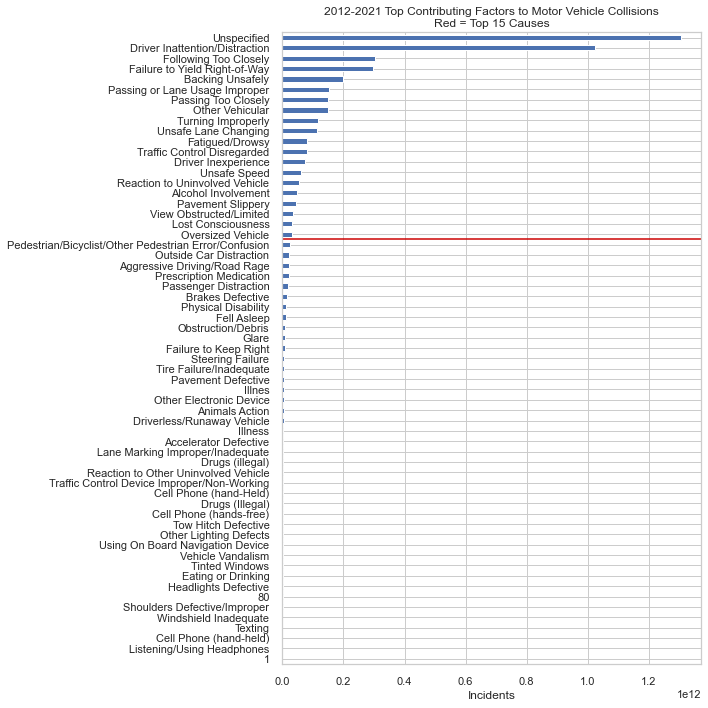

In [239]:
def plot_top_causes(data):
    d = data[(data['YEAR']<=2020) | ((data['MONTH'] <=3) & (data['YEAR']==2021))]
    d = d.groupby('CONTRIBUTING FACTOR VEHICLE 1').agg({'COLLISION_ID': np.sum}).sort_values(by='COLLISION_ID')
    d.plot(kind='barh', legend=False, figsize=(10,10))
    plt.title('2012-2021 Top Contributing Factors to Motor Vehicle Collisions\nRed = Top 15 Causes')
    plt.xlabel('Incidents')
    plt.ylabel('')
    plt.axhline(len(d)-20.5, color='#CC0000')
    plt.tight_layout()
    plt.savefig('nypd_largest_reasons.jpg', dpi=80)

plot_top_causes(df)



The top causes to accidents are visualised above.

Among these it is especially:

- Driver inattention/Distraction

- Following to closely

- Failure to yield right-of-way

**Now lets have a look at which vehicle types that are responsible for the most crashes**

In [271]:
df_ve=df.groupby("VEHICLE TYPE CODE 1").sum()

In [272]:
df_crashes=df.groupby("VEHICLE TYPE CODE 1").count()

In [274]:
df_crashes["COLLISION_ID"].nlargest(5)

VEHICLE TYPE CODE 1
Sedan                                  403603
PASSENGER VEHICLE                      347161
Station Wagon/Sport Utility Vehicle    317628
SPORT UTILITY / STATION WAGON          150919
Taxi                                    40273
Name: COLLISION_ID, dtype: int64

In [275]:
df_ve["NUMBER OF PERSONS INJURED"].nlargest(5)

VEHICLE TYPE CODE 1
Sedan                                  117559.0
PASSENGER VEHICLE                       90371.0
Station Wagon/Sport Utility Vehicle     89318.0
SPORT UTILITY / STATION WAGON           38468.0
Taxi                                    12322.0
Name: NUMBER OF PERSONS INJURED, dtype: float64

From this we can see that the above are the top 5 vehicles responsible for car crashes. 

**Lets se at what ratio people are being injured when involved in a crash in such a vehicle type**

In [276]:
df_ratio=pd.DataFrame(df_ve["NUMBER OF PERSONS INJURED"].nlargest(5)/df_crashes["COLLISION_ID"].nlargest(5))

In [277]:
df_ratio.rename(columns = {0:"Ratio of injured"}, inplace = False)

,Ratio of injured
VEHICLE TYPE CODE 1,
Sedan,0.291274
PASSENGER VEHICLE,0.260314
Station Wagon/Sport Utility Vehicle,0.281203
SPORT UTILITY / STATION WAGON,0.254892
Taxi,0.305962


The above shows the risk of being injured when involved in a car crash with a certain car type.

The interactive map below illustrates the severity of car crashes in the different Boroughs of New York, as it shows the amount of crashes that have happened over the past 10 years.

**Illustration of numbers of crashes in the different Boroughs in New York:**

In [225]:
grouped12=df.groupby(["BOROUGH" , "YEAR"])["COLLISION_ID"].count().unstack(1) #group data

grouped12.to_excel("dataoutput.xlsx") 

df_newvalues= pd.read_excel("dataoutput-kopi.xlsx")   #read dataset 

#this converts it to the right output

import json
communities_geo = 'newyorkboroughs.geojson.txt'

# open the json file - json.load() methods returns a python dictionary
with open(communities_geo) as communities_file:
    communities_json = json.load(communities_file)
    
# we loop through the dictionary to obtain the name of the communities in the json file
denominations_json = []
for index in range(len(communities_json['features'])):
    denominations_json.append(communities_json['features'][index]['properties']['name'])
    
denominations_json

['Staten Island', 'Queens', 'Brooklyn', 'Manhattan', 'Bronx']

In [227]:
# names in the data frame
dataframe_names = df_newvalues.BOROUGH.tolist()

# names in the json file - the same order as in the data frame 
geojson_names = ['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island']

# replace data frame names by json names
df_newvalues.replace(dict(zip(dataframe_names, geojson_names)), inplace=True)


# file name - file is located in the working directory
communities_geo = r'newyorkboroughs.geojson.txt' # geojson file

# create a plain world map
communities_map = folium.Map(location=[40.730610, -73.935242], zoom_start=10, tiles='CartoDB positron')

# add tile layers to the map
tiles = ['stamenwatercolor','cartodbpositron','openstreetmap','stamenterrain']
for tile in tiles:
    folium.TileLayer(tile).add_to(communities_map)

# generate choropleth map 
choropleth = folium.Choropleth(
    geo_data=communities_geo,
    data=df_newvalues,
    columns=['BOROUGH', 'Total'],
    key_on='feature.properties.name',
    fill_color='YlGnBu', 
    fill_opacity=0.8, 
    line_opacity=1,
    legend_name='Number of Crashes',
    highlight=True,
    smooth_factor=0).add_to(communities_map)

# add labels indicating the name of the community
style_function = "font-size: 15px; font-weight: bold"
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name'], style=style_function, labels=False))

# create a layer control
folium.LayerControl().add_to(communities_map)

# display map
communities_map.save("communities_map.html")
communities_map

**Map showing the occurences of the crashes below:**

In [228]:
locations = df_new[['LATITUDE', 'LONGITUDE']]
locationlist = locations.values.tolist()
len(locationlist)

map2 = folium.Map(location=[40.730610, -73.935242], tiles='CartoDB positron', zoom_start=10)




marker_cluster = MarkerCluster().add_to(map2)


for point in range(0, len(locationlist)):
    folium.CircleMarker(locationlist[point]).add_to(marker_cluster) #create cluster

map2.save("mapcluster.html")

map2

**Collision by boroughs in the period from 2012-2020 below:**

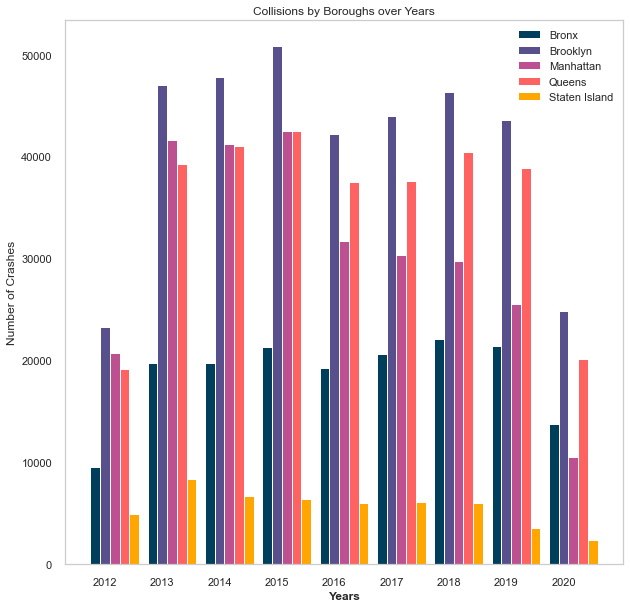

In [230]:
grouped_year=df.groupby(["BOROUGH" , "YEAR"])["COLLISION_ID"].count().unstack(0) #group the data

grouped_year.to_excel("datayear.xlsx")  

df_newyear= pd.read_excel("datayear.xlsx")   #read dataset

df_newyear.drop(df_newyear.tail(1).index,inplace=True) #Drop year 2021

# libraries
import numpy as np
import matplotlib.pyplot as plt
 
# set width of bars
barWidth = 0.17
 

# Set position of bar on X axis
r1 = np.arange(len(df_newyear["BRONX"]))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r4]
 
    
# Make the plot
plt.bar(r1, df_newyear["BRONX"], color='#003f5c', width=barWidth, edgecolor='white', label='Bronx')
plt.bar(r2, df_newyear["BROOKLYN"], color='#58508d', width=barWidth, edgecolor='white', label='Brooklyn')
plt.bar(r3, df_newyear["MANHATTAN"], color='#bc5090', width=barWidth, edgecolor='white', label='Manhattan')
plt.bar(r4, df_newyear["QUEENS"], color='#ff6361', width=barWidth, edgecolor='white', label='Queens')
plt.bar(r5, df_newyear["STATEN ISLAND"], color='#ffa600', width=barWidth, edgecolor='white', label='Staten Island')
# Add xticks on the middle of the group bars
plt.xlabel('Years', fontweight='bold')
plt.ylabel('Number of Crashes')
plt.title("Collisions by Boroughs over Years")
plt.xticks([r + barWidth for r in range(len(df_newyear["BRONX"]))], ["2012","2013","2014","2015","2016","2017","2018","2019","2020"])
 
# Create legend & Show graphic
plt.legend()
plt.grid(b=None)
plt.show()



**Numbers of serious incidents:**

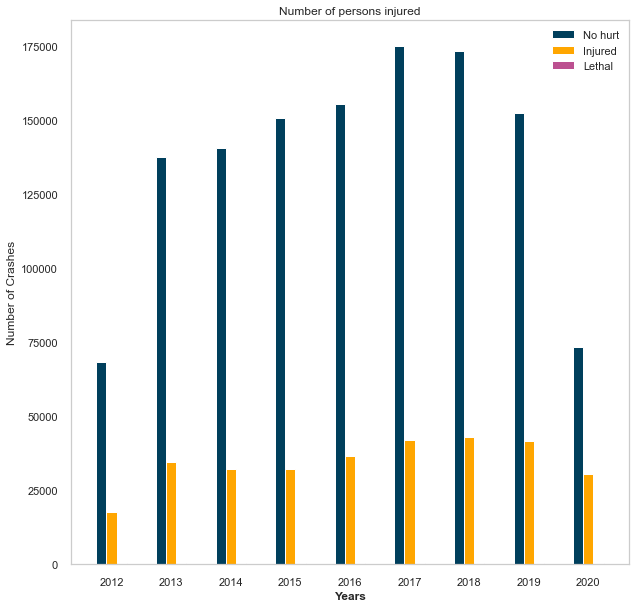

In [232]:
grouped_injured=df.groupby(["NUMBER OF PERSONS INJURED","YEAR"])['COLLISION_ID'].count().unstack(0) #group the data


grouped_injured=grouped_injured.fillna(0) #data of injured people
grouped_injured.drop(grouped_injured.tail(1).index,inplace=True) #Drop year 2021



grouped_injured.to_excel("datainjured.xlsx")  
df_injured= pd.read_excel("datainjured.xlsx")   #read dataset



grouped_killed=df.groupby(["NUMBER OF PERSONS KILLED","YEAR"])['COLLISION_ID'].count().unstack(0) #group the data


grouped_killed=grouped_killed.fillna(0) #data of killed people
grouped_killed.drop(grouped_killed.tail(1).index,inplace=True) #Drop year 2021


grouped_killed.to_excel("datakilled.xlsx")  
df_killed=pd.read_excel("datakilled.xlsx")   #read dataset

import numpy as np
import matplotlib.pyplot as plt
 
# set width of bars
barWidth = 0.17
 

# Set position of bar on X axis
r1 = np.arange(len(df_injured[0]))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r4]
 
    
# Make the plot
plt.bar(r1, df_injured[0.0], color='#003f5c', width=barWidth, edgecolor='white', label='No hurt')
plt.bar(r2, df_injured[1]+df_injured[2]+df_injured[3]+df_injured[4]+df_injured[5]+
        df_injured[6]+df_injured[7]+df_injured[8]+df_injured[9], color='#ffa600', width=barWidth, edgecolor='white', label='Injured')
plt.bar(r3, df_killed[1]+df_killed[2]+df_killed[3]+df_killed[4]+df_killed[5]+df_killed[8], color='#bc5090', width=barWidth, edgecolor='white', label="Lethal")

# Add xticks on the middle of the group bars
plt.xlabel('Years', fontweight='bold')
plt.ylabel('Number of Crashes')
plt.title("Number of persons injured")
plt.xticks([r + barWidth for r in range(len(df_injured[0]))], ["2012","2013","2014","2015","2016","2017","2018","2019","2020"])
 
# Create legend & Show graphic
plt.legend()
plt.grid(b=None)
plt.show()



Such a big dataset will of course always contain some erros, which sometimes can be worked around and sometimes you just have to live with it. This is an example of New Yorks finest being not so fine.

The jitterplot shows at what time the different crashes have happened, or at least at what time they are registrered.**

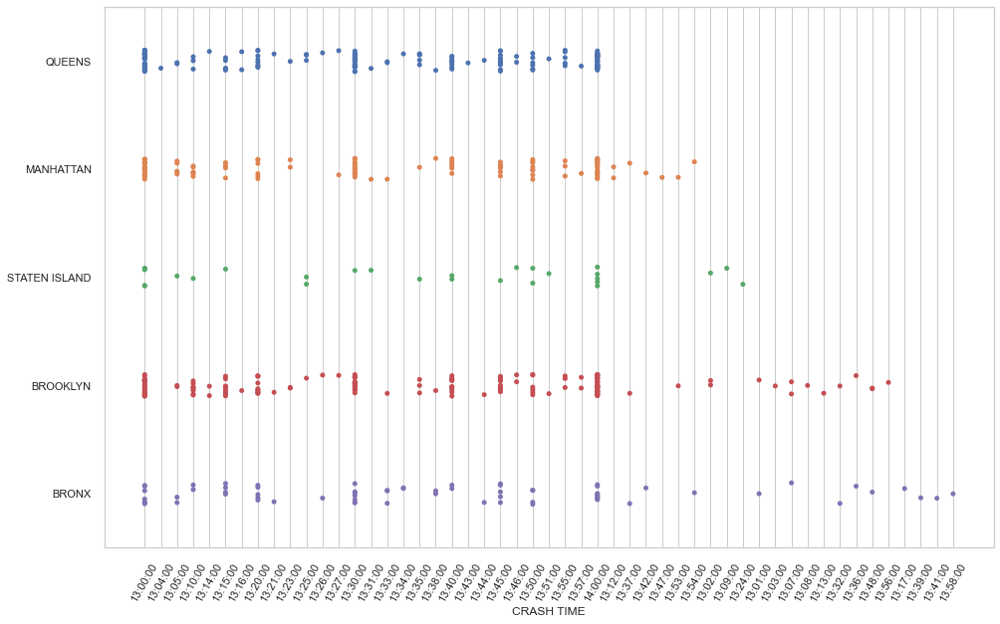

In [233]:
df_new['CRASH TIME'] = pd.to_datetime(df_new['CRASH TIME'], format="%H:%M")

df_time=df_new.set_index("CRASH TIME").between_time("13:00", "14:00").reset_index() 
df_time["CRASH TIME"]=df_time["CRASH TIME"].dt.time #new column called crash  time
df_final=df_time.set_index("CRASH TIME").sort_index() #sort the column

plt.rcParams['figure.figsize'] = [16, 10]
 
plt.title
sns.set_theme(style="whitegrid") #plot the data
sns.stripplot(x=df_final.index.astype(str), y=df_final["BOROUGH"], orient='h') #jitterplot
plt.ylabel('')
plt.xticks(rotation=60)
plt.show()

**Hourly occurences:**

The plot seems to show some trends for occurences of car crashes and the hour of the day.
From the plot it can be seen that all boroughs have a peak between 8-19.
This makes sense as this time of the day is where the most people are driving around.

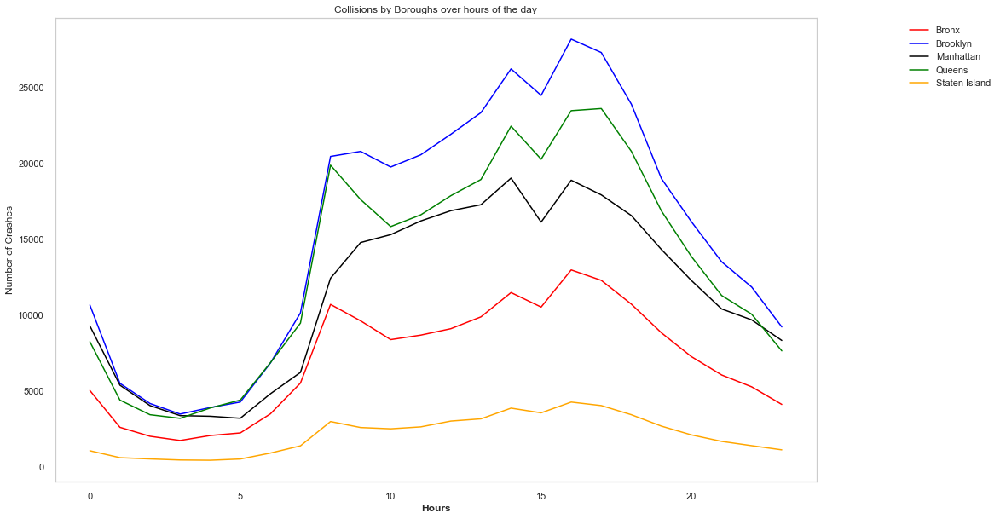

In [234]:
grouped_week2=df.groupby(["BOROUGH","HOUR"])['COLLISION_ID'].count().unstack(0) #group the data


grouped_week2.to_excel("dataweek2.xlsx")  
df_week2= pd.read_excel("dataweek2.xlsx")   #read dataset


# Make the plot
plt.plot( df_week2["BRONX"], color='red',  label='Bronx')
plt.plot(df_week2["BROOKLYN"], color='blue', label='Brooklyn')
plt.plot(df_week2["MANHATTAN"], color='black', label='Manhattan')
plt.plot(df_week2["QUEENS"], color='green',   label='Queens')
plt.plot(df_week2["STATEN ISLAND"], color='#ffa600',  label='Staten Island')
# Add xticks on the middle of the group bars

plt.xlabel('Hours', fontweight='bold')
plt.ylabel('Number of Crashes')
plt.title("Collisions by Boroughs over hours of the day")
 
    
    
# Create legend & Show graphic
plt.legend(bbox_to_anchor=(1.24, 1),loc='upper right')
plt.grid(b=None)
fig1=plt.show()



**Heat map of hourly crashes**

As above this shows how there is a peak at certain hours.

In [235]:
df_heat = df_new[['LATITUDE', 'LONGITUDE']] #create heat DF


heat_data = [[row['LATITUDE'],row['LONGITUDE']] for index, row in df_heat.iterrows()]


map_hourly = folium.Map(location=[40.730610, -73.935242],tiles='CartoDB positron',
                    zoom_start = 11) 




# Create weight column, using date
df_heat['Weight'] = df_new['HOUR']
df_heat['Weight'] = df_heat['Weight']
df_heat = df_heat.dropna(axis=0, subset=['LATITUDE','LONGITUDE', 'Weight'])

heat_data = [[[row['LATITUDE'],row['LONGITUDE']] for index, row in df_heat[df_heat['Weight'] == i].iterrows()]
             for i in range(0,24)]

hm = plugins.HeatMapWithTime(heat_data,auto_play=True,max_opacity=0.8)
hm.add_to(map_hourly)


title_html = '''
             <h3 align="center" style="font-size:20px"><b>Heatmap - Hourly occurences </b></h3>
             '''
map_hourly.get_root().html.add_child(folium.Element(title_html))

map_hourly.save("map_hourly.html")
map_hourly



**Weekly plot of car crashes**

Now that the influence of the hour the day has been shown. It is also interesting to have a look at the different days during a week and see if there are any trends.

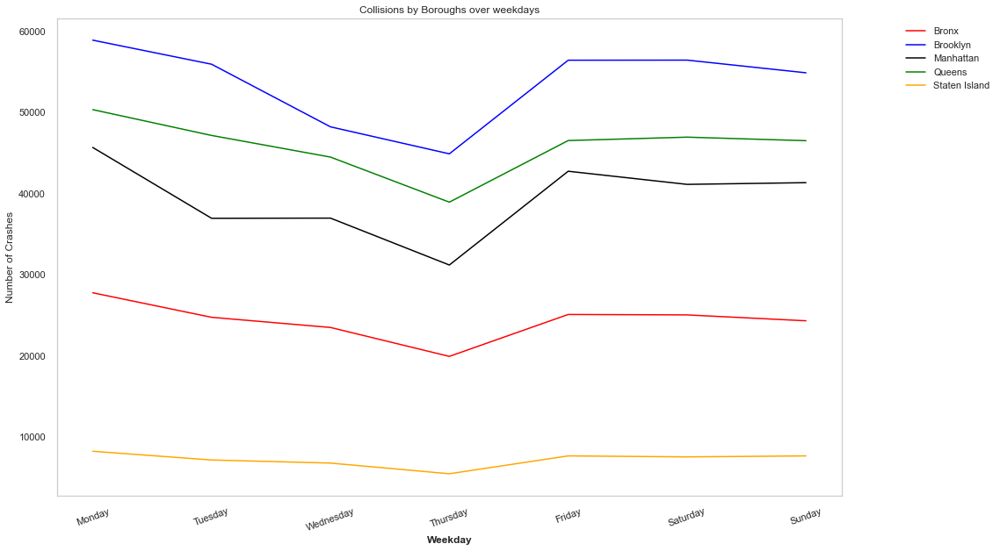

In [236]:
grouped_weekday2=df.groupby(["BOROUGH" , "WEEKDAY"])["COLLISION_ID"].count().unstack(0) #group the data

grouped_weekday2.to_excel("dataweekday.xlsx")  
df_weekday2= pd.read_excel("dataweekday.xlsx")   #read dataset



week_list = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday','Sunday']
grouped_weekday2=grouped_weekday2.reindex(week_list)




# Make the plot
plt.plot(df_weekday2["BRONX"], color='red',  label='Bronx')
plt.plot(df_weekday2["BROOKLYN"], color='blue', label='Brooklyn')
plt.plot(df_weekday2["MANHATTAN"], color='black', label='Manhattan')
plt.plot(df_weekday2["QUEENS"], color='green',   label='Queens')
plt.plot(df_weekday2["STATEN ISLAND"], color='#ffa600',  label='Staten Island')
# Add xticks on the middle of the group bars
plt.xlabel('Weekday', fontweight='bold')
plt.ylabel('Number of Crashes')
plt.title("Collisions by Boroughs over weekdays")
plt.xticks([0, 1, 2,3,4,5,6],['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday','Sunday'],rotation=20)
 
# Create legend & Show graphic
plt.legend(bbox_to_anchor=(1.2, 1),loc='upper right')
plt.grid(b=None)
plt.show()

**Weekly car crashes heat map:**

In [237]:
map_weekly = folium.Map(location=[40.730610, -73.935242],tiles='CartoDB positron',
                    zoom_start = 11) 


# Create weight column, using date
df_heat['Weight'] = df_new['WEEKDAY_number']
df_heat['Weight'] = df_heat['Weight']
df_heat = df_heat.dropna(axis=0, subset=['LATITUDE','LONGITUDE', 'Weight'])



heat_data = [[[row['LATITUDE'],row['LONGITUDE']] for index, row in df_heat[df_heat['Weight'] == i].iterrows()]
             for i in range(0,7)]







hm = plugins.HeatMapWithTime(heat_data,auto_play=True,max_opacity=0.8)
hm.add_to(map_weekly)


title_html = '''
             <h3 align="center" style="font-size:20px"><b>Heatmap - Weekly occurences </b></h3>
             '''
map_weekly.get_root().html.add_child(folium.Element(title_html))



map_weekly.save("map_weekly.html")
map_weekly

**Crashes each month**

Now it is being investigated whether the month of the year also has an influence on the number of crashes.

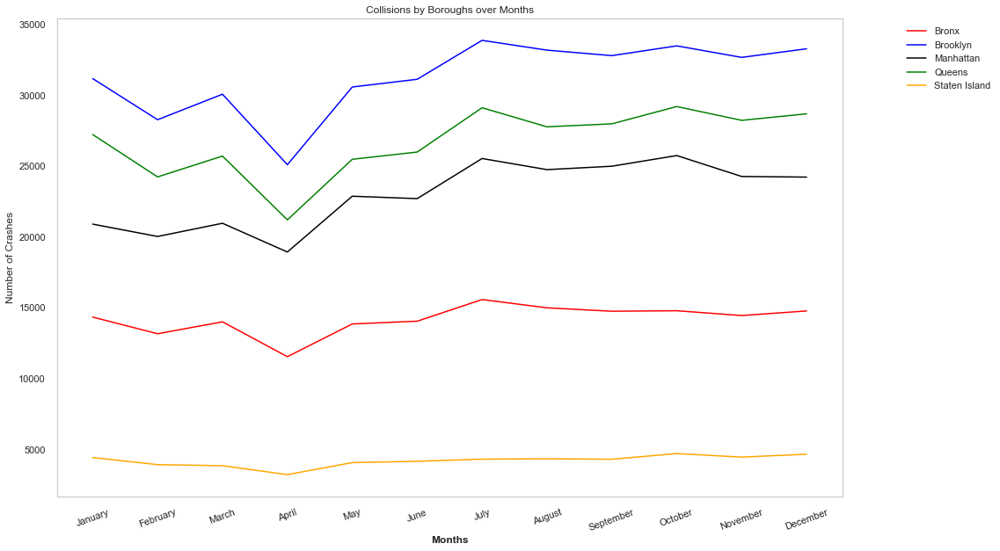

In [238]:
grouped_month2=df.groupby(["BOROUGH" , "MONTH"])["COLLISION_ID"].count().unstack(0) #group the data

grouped_month2.to_excel("datamonth2.xlsx")  


df_month2= pd.read_excel("datamonth2.xlsx")   #read dataset




# Make the plot
plt.plot(df_month2["BRONX"], color='red',  label='Bronx')
plt.plot(df_month2["BROOKLYN"], color='blue', label='Brooklyn')
plt.plot(df_month2["MANHATTAN"], color='black', label='Manhattan')
plt.plot(df_month2["QUEENS"], color='green',   label='Queens')
plt.plot(df_month2["STATEN ISLAND"], color='#ffa600',  label='Staten Island')
# Add xticks on the middle of the group bars
plt.xlabel('Months', fontweight='bold')
plt.ylabel('Number of Crashes')
plt.title("Collisions by Boroughs over Months")
plt.xticks([0, 1, 2,3,4,5,6,7,8,9,10,11],['January', 'February','March', 'April', 'May', 'June', 'July', 'August',
              'September','October','November','December'],rotation=20)
 
# Create legend & Show graphic
plt.legend(bbox_to_anchor=(1.2, 1),loc='upper right')
plt.grid(b=None)
plt.show()

From the plot it can be seen that the summer months tends to have the most occurences of car crashes.

**Monthly crashes heatmap**

In [210]:
map_monthly = folium.Map(location=[40.730610, -73.935242], tiles='CartoDB positron',
                    zoom_start = 11) 

# Create weight column, using date
df_heat['Weight'] = df_new['MONTH']
df_heat['Weight'] = df_heat['Weight']
df_heat = df_heat.dropna(axis=0, subset=['LATITUDE','LONGITUDE', 'Weight'])


heat_data = [[[row['LATITUDE'],row['LONGITUDE']] for index, row in df_heat[df_heat['Weight'] == i].iterrows()]
             for i in range(0,12)]



hm = plugins.HeatMapWithTime(heat_data,auto_play=True,max_opacity=0.8)
hm.add_to(map_monthly)



title_html = '''
             <h3 align="center" style="font-size:20px"><b>Heatmap - Monthly occurences</b></h3>
             '''
map_monthly.get_root().html.add_child(folium.Element(title_html))

map_monthly.save("map_monthly.html")
map_monthly



# Random forest classifier model

**Before starting the prediction we create a binary column which states wheter a person is being injured or not during a car collision.**

In [130]:
cluster=[]
for i in range(len(df_new)):
    if df_new.iloc[i]["NUMBER OF PERSONS INJURED"]>0:
        cluster.append(1)
    else:
        cluster.append(0)
df_new["Injury Binary"]=pd.DataFrame(cluster)

**Creating dummies for WEEKDAY, BOROUGH, CONTRIBUTING FACTOR VEHICLE 1 AND VEHICLE TYPE CODE 1.
It has been decided to make dummies on CONTRIBUTING FACTOR VEHICLE 1 and VEHICLE TYPE CODE 1 as CONTRIBUTING FACTOR VEHICLE 2-5 and VEHICLE TYPE CODE 2-5 are having to many NaN values while containing the same string as the others.**

In [131]:
df_test=pd.get_dummies(data=df_new, columns=["WEEKDAY","BOROUGH","CONTRIBUTING FACTOR VEHICLE 1","VEHICLE TYPE CODE 1"])


**Now the unnecesarry columns that does not play an important role or are too difficult to predict from are being remowed**

**Furthermore, the training and test data is prepared by dropping the columns that is much a like our target Injury Binary where we will try to predict if there is an injury in a car crash or not.**

**Therefore, are columns such as NUMBER OF PERSONS INJURED, NUMBER OF PERSONS KILLED etc. removed as they have a too large correlation with our target variable.**

In [132]:
df_test=df_test.drop(["ZIP CODE","YEAR","CRASH DATE","CRASH TIME",'LONGITUDE','LATITUDE','ON STREET NAME','CROSS STREET NAME','OFF STREET NAME','CONTRIBUTING FACTOR VEHICLE 2',
         'CONTRIBUTING FACTOR VEHICLE 3','CONTRIBUTING FACTOR VEHICLE 4','CONTRIBUTING FACTOR VEHICLE 5','VEHICLE TYPE CODE 2','VEHICLE TYPE CODE 3',
         'VEHICLE TYPE CODE 4','VEHICLE TYPE CODE 5','COLLISION_ID'], axis=1)
split=int(len(df_test)*2/3)
training=df_test[:split]
test=df_test[split:]
to_drop=["NUMBER OF PERSONS INJURED", "NUMBER OF PERSONS KILLED", "NUMBER OF PEDESTRIANS INJURED","NUMBER OF PEDESTRIANS KILLED","NUMBER OF CYCLIST INJURED","NUMBER OF CYCLIST KILLED","NUMBER OF MOTORIST INJURED","NUMBER OF MOTORIST KILLED","Injury Binary",'WEEKDAY_number']
x_train=training.drop(to_drop, axis=1)
y_train=training["Injury Binary"]
x_test=test.drop(to_drop, axis=1)
y_test=test["Injury Binary"]

In [133]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, recall_score, accuracy_score, precision_score

model = RandomForestClassifier(n_estimators=100, random_state=0)

In [134]:
model.fit(x_train,y_train)

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:489: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the relea

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the relea

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the relea

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=0, verbose=0,
                       warm_start=False)

In [135]:
prediction=model.predict(x_test)

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/base.py:158: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



In [136]:
def evaluate(y_true, y_pred, print_cm=False):
    # calculate and display confusion matrix
    labels = np.unique(y_true)
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    if print_cm:
        print('Confusion matrix\n- x-axis is true labels (none, comp1, etc.)\n- y-axis is predicted labels')
        print(cm)

    # calculate precision, recall, and F1 score
    accuracy = float(np.trace(cm)) / np.sum(cm)
    precision = precision_score(y_true, y_pred, average=None, labels=labels)[1]
    recall = recall_score(y_true, y_pred, average=None, labels=labels)[1]
    f1 = 2 * precision * recall / (precision + recall)
    print("accuracy:", accuracy)
    print("precision:", precision)
    print("recall:", recall)
    print("f1 score:", f1)

In [137]:
y_pred_train = model.predict(x_train)
y_pred_test = model.predict(x_test)

print("- Train set results:")
evaluate(y_train, y_pred_train)
print("- Test set results:")
evaluate(y_test, y_pred_test)

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/base.py:158: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/base.py:158: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check t

- Train set results:
accuracy: 0.9948994899489949
precision: 0.9942979330007128
recall: 0.9817030260380014
f1 score: 0.9879603399433429
- Test set results:
accuracy: 0.756748650269946
precision: 0.3333333333333333
recall: 0.09742895805142084
f1 score: 0.15078534031413612


**From the result above we see that our training accuracy is 0.995 and test accuracy is 0.757. Such a high accuracy on the training set implies the model is overfitting as the model seems to be much like our training data**

**Though the model is overfitting it is still investigated which features are the most important when it comes to predicting an injury or not**

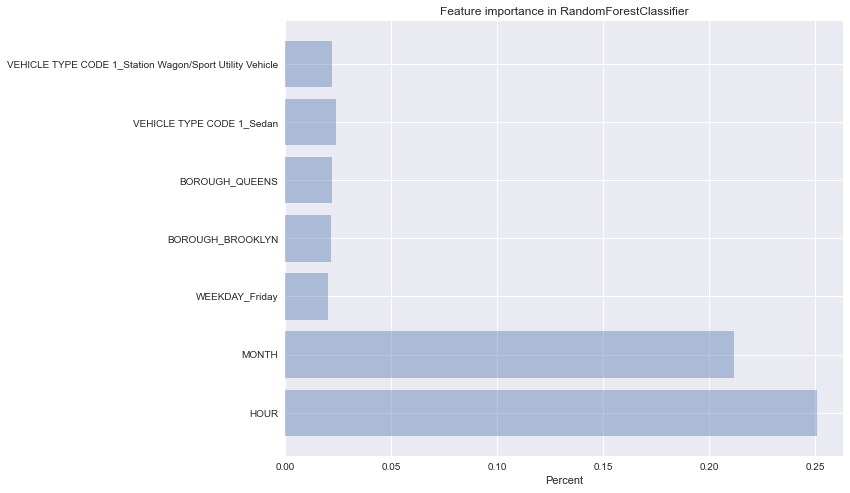

In [138]:
performance_list=model.feature_importances_
attributes_names=list(x_train.columns)
performance_list2=list(performance_list)

names=[name for name,value in dict(zip(attributes_names,performance_list2)).items() if value>=0.02]
performance=[value for name,value in dict(zip(attributes_names,performance_list2)).items() if value>=0.02]
f,ax = plt.subplots( figsize=(10,8))
y_pos = np.arange(len(names))
plt.barh(y_pos, performance, align='center', alpha=0.4)
plt.yticks(y_pos, names)
plt.xlabel('Percent')
plt.title('Feature importance in RandomForestClassifier')

plt.show()

**As shown in the visualisations and statistics there where definetely som trends about car crashes happening at a certain hour and the people might also tend to be injured in this time interval. Therefore the HOUR of the day is playing a major role in predicting an injury. The same corresponds to the month where the summer months tends to have more crashes than normally.**

**Looking at the location Brooklyn and Queens are also the locations with the most crashes which as above might have a correlation with more people being injured**

**From the Statistics we also saw that SUV and Sedan were the cars where most people are getting injured**

In [139]:
confusion_matrix(y_test, prediction)

array([[2451,  144],
       [ 667,   72]])

**To see what the actual performance of the model a confusion matrix has been displayed above.
This Matrix shows that the model is predicting 2459 crashes where no injuries are happening correctly while predicting that there will be no injury 667 times where there actually is an injury. The model therefore only predicts 76 cases where there actually is an injury correct. At the same time it also predicts 144 crashes not to have injuries where an injury is happening.**

**So even though the model score seems quite good it only predicts 72 injuries when a sum of 738 injuries are happening**

# Hyper parameter tuning and Random forest clasifier

**After investigation it was found out that choosing a number of max_leaf_nodes could prevent the model from overfitting**

**This hyperparameter is setting a condition on the splitting of the nodes in the tree and thereby it restricts the growth of the tree. This causes that if we after the splitting have more leaf nodes than the value we have set it will stop splitting and the three will thereby not grow any further**



In [140]:
model1=RandomForestClassifier(max_leaf_nodes = 350)

In [141]:

from sklearn.model_selection import learning_curve
train_sizes = [1, 500, 3000, 4000, 5332]
features = list(x_train.columns)
target = ["Injury Binary"]
train_sizes, train_scores, validation_scores = learning_curve(
estimator = model1,
X = x_train,
y = y_train, train_sizes = train_sizes, cv = 5,
scoring = 'neg_mean_squared_error')

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:670: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your cu

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the relea

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the relea

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the relea

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:489: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the relea

In [142]:
print('Training scores:\n\n', train_scores)
print('\n', '-' * 70) # separator to make the output easy to read
print('\nValidation scores:\n\n', validation_scores)

Training scores:

 [[-0.         -0.         -0.         -0.         -0.        ]
 [-0.026      -0.034      -0.038      -0.046      -0.04      ]
 [-0.14166667 -0.15233333 -0.146      -0.14433333 -0.14733333]
 [-0.16125    -0.1605     -0.1525     -0.164      -0.16675   ]
 [-0.17423106 -0.17535634 -0.1719805  -0.1776069  -0.16935484]]

 ----------------------------------------------------------------------

Validation scores:

 [[-0.78635682 -0.21305326 -0.21305326 -0.21305326 -0.21305326]
 [-0.24512744 -0.23630908 -0.24606152 -0.23630908 -0.23330833]
 [-0.2173913  -0.21305326 -0.21455364 -0.22655664 -0.22730683]
 [-0.20989505 -0.22055514 -0.22730683 -0.22055514 -0.21830458]
 [-0.21214393 -0.21305326 -0.21530383 -0.2168042  -0.21905476]]


In [143]:
train_scores_mean = -train_scores.mean(axis = 1)
validation_scores_mean = -validation_scores.mean(axis = 1)
print('Mean training scores\n\n', pd.Series(train_scores_mean, index = train_sizes))
print('\n', '-' * 20) # separator
print('\nMean validation scores\n\n',pd.Series(validation_scores_mean, index = train_sizes))

Mean training scores

 1      -0.000000
500     0.036800
3000    0.146333
4000    0.161000
5332    0.173706
dtype: float64

 --------------------

Mean validation scores

 1       0.327714
500     0.239423
3000    0.219772
4000    0.219323
5332    0.215272
dtype: float64


**By the following code below it is visualised how the training error and test error will converge towards each other and thereby prevent overfitting**

(0.0, 0.3)

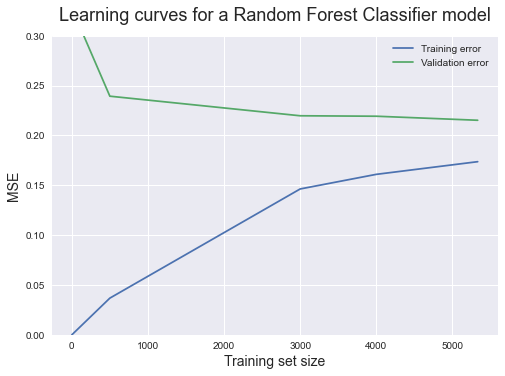

In [144]:
import matplotlib.pyplot as plt

plt.style.use('seaborn')
plt.plot(train_sizes, train_scores_mean, label = 'Training error')
plt.plot(train_sizes, validation_scores_mean, label = 'Validation error')
plt.ylabel('MSE', fontsize = 14)
plt.xlabel('Training set size', fontsize = 14)
plt.title('Learning curves for a Random Forest Classifier model', fontsize = 18, y = 1.03)
plt.legend()
plt.ylim(0,0.3)



**The results of the new model with the max_leaf_nodes being tuned will now be displayed below**

In [145]:
model1.fit(x_train,y_train)

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:489: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=350,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [146]:
y_pred=model1.predict(x_test)

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/base.py:158: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



In [147]:
y_pred_train = model1.predict(x_train)
y_pred_test = model1.predict(x_test)

print("- Train set results:")
evaluate(y_train, y_pred_train)
print("- Test set results:")
evaluate(y_test, y_pred_test)

- Train set results:
accuracy: 0.8157815781578158
precision: 0.9707317073170731
recall: 0.14004222378606615
f1 score: 0.24477244772447723
- Test set results:
accuracy: 0.7822435512897421
precision: 0.6226415094339622
recall: 0.044654939106901215
f1 score: 0.08333333333333333


/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/base.py:158: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/base.py:158: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check t

**From accuracy it is now clear to see that it is not overfitting so much as the train accuracy is 0.816 and the test accuracy is 0.779. As the train and test errors are now much closer this implies the model isn´t showing the outcome by going through every single data point in the training set but that it has actually created a model that can be independent from the training set**

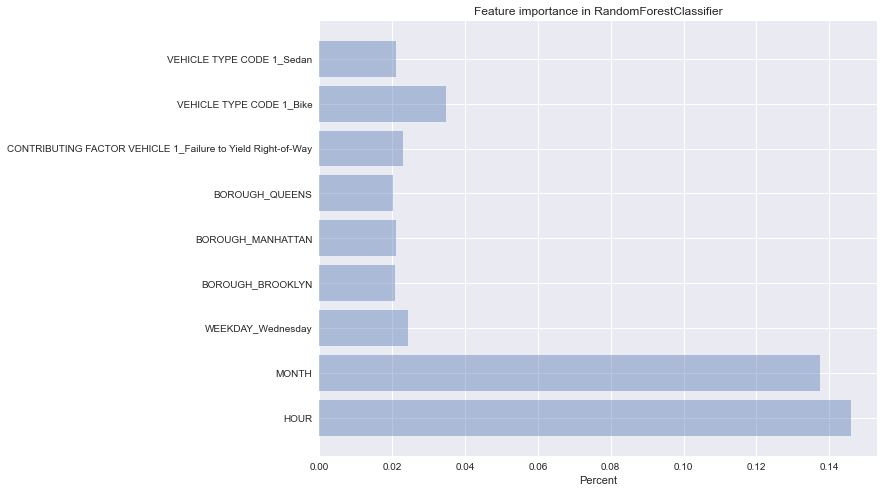

In [148]:
performance_list=model1.feature_importances_
attributes_names=list(x_train.columns)
performance_list2=list(performance_list)

names=[name for name,value in dict(zip(attributes_names,performance_list2)).items() if value>=0.02]
performance=[value for name,value in dict(zip(attributes_names,performance_list2)).items() if value>=0.02]
f,ax = plt.subplots( figsize=(10,8))
y_pos = np.arange(len(names))
plt.barh(y_pos, performance, align='center', alpha=0.4)
plt.yticks(y_pos, names)
plt.xlabel('Percent')
plt.title('Feature importance in RandomForestClassifier')

plt.show()

**From the random forest classifier where the max_leaf_nodes now has been changed it is visible from the plot above that the HOUR and MONTH features are having a smaller influence than before. On the other hand there are now more features involved. The Boroughs are still having an importance but now Bronx is also involved, the reason why it wasn´t there before might be that the importance of the features have been split more equally than before.**

**Moreover, the vehicle type Bike is a new feature which has a relative large importance. This seems reasonable as cyclists/motorcyclists are more in danger of being injured when being involved in a car crash**

**To evaluate the performance there is made a confusion matrix below. The matrix shows that it is actually predicting less injuries in total compared to before and the better accuracy might therefore be caused by the model predicting more incidents without injuries correctly (True positives).**

In [149]:
confusion_matrix(y_test, y_pred)

array([[2575,   20],
       [ 706,   33]])

**Even though the model is performing better and overfits less it seems like it is worse off at predicting injuries caused by car crashes**.

**The model is predicting 706 crashes with injuries wrongly and only 33 crashes with injuries correctly.**

**As a reaction to this it will now be investigated whether if weather data could help the model in the prediction or not.**

# Prediction with weather data and hyperparameter tuning

**Firstly the weather data for New York is being read from 2021-2021 and then merged.**

In [162]:
df1=pd.read_csv("NYCW_2012.csv")
df2=pd.read_csv("NYCW_2013.csv")
df3=pd.read_csv("NYCW_2014.csv")
df4=pd.read_csv("NYCW_2015.csv")
df5=pd.read_csv("NYCW_2016.csv")
df6=pd.read_csv("NYCW_2017.csv")
df7=pd.read_csv("NYCW_2018.csv")
df8=pd.read_csv("NYCW_2019.csv")
df9=pd.read_csv("NYCW_2020.csv")
df10=pd.read_csv("NYCW_2021.csv")

In [163]:
dfw=df1.append(df2).append(df3).append(df4).append(df5).append(df6).append(df7).append(df8).append(df9).append(df10)

**We take a closer look at the attributes the dataset has.**

In [164]:
dfw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4091 entries, 0 to 118
Data columns (total 24 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   STATION  4091 non-null   object 
 1   NAME     4091 non-null   object 
 2   DATE     4091 non-null   object 
 3   AWND     3185 non-null   float64
 4   PRCP     4034 non-null   float64
 5   SNOW     3553 non-null   float64
 6   SNWD     3397 non-null   float64
 7   TAVG     0 non-null      float64
 8   TMAX     3394 non-null   float64
 9   TMIN     3394 non-null   float64
 10  WSF5     3165 non-null   float64
 11  WT01     1144 non-null   float64
 12  WT02     77 non-null     float64
 13  WT03     83 non-null     float64
 14  WT04     10 non-null     float64
 15  WT06     17 non-null     float64
 16  WT08     583 non-null    float64
 17  WT11     1 non-null      float64
 18  WT13     163 non-null    float64
 19  WT14     1 non-null      float64
 20  WT16     171 non-null    float64
 21  WT18     40 non

**As the length of the dataset seems to be a bit off by having 4091 datapoints when it isn´t even a total of ten years some data handeling needs to be done**

In [165]:
len(dfw)

4091

In [166]:
dfw=dfw.drop_duplicates(subset=['DATE'])
len(dfw)

3394

**The above number of observations seems more reasonable**

**Before moving on the attributes named WT are a weather type and it has therefore been investigated which weather type the different ones are and inserted to make it more friendly to the reader.**

In [167]:
dfw = dfw.rename(columns = {'WT01': "Fog, ice fog, or freezing fog (may include heavy fog)","WT02": 'Heavy fog or heaving freezing fog (not always distinguished from fog)',"WT03":"Thunder","WT04":"Ice pellets, sleet, snow pellets, or small hail","WT06":"Glaze or rime ",
                            "WT08":"Smoke or haze ","WT11":"High or damaging winds","WT13":"Mist","WT14":"Drizzle",
                            "WT16":"Rain (may include freezing rain, drizzle, and freezing drizzle)","WT18":"Snow, snow pellets, snow grains, or ice crystals",
                           "WT19":"Unknown source of precipitation","WT22":"Ice fog or freezing fog"}, inplace = False)



**From below it can be stated that some columns are missing more values than others.**
**But taking a closer look at the data it can bee seen that many of these are caused by nothing being recorded the specific date and actually it should just have had a value of zero. For example the diffefrent weather types.
The only attribute where there seems to be a mistake is the average temperature where TMIN and TMAX can be close to eachother without having an TAVG.**

In [168]:
dfw.isna().sum()

STATION                                                                     0
NAME                                                                        0
DATE                                                                        0
AWND                                                                      209
PRCP                                                                        0
SNOW                                                                        0
SNWD                                                                        0
TAVG                                                                     3394
TMAX                                                                        0
TMIN                                                                        0
WSF5                                                                      229
Fog, ice fog, or freezing fog (may include heavy fog)                    2250
Heavy fog or heaving freezing fog (not always distinguished from

In [169]:
dfw=dfw.fillna(0)

**The DATE of the weather date is transformed to datetime and being renamed to CRASH DATE so that the dataframes df_new and dfw can be merged on the CRASH DATE.**

In [170]:
dfw['DATE'] = pd.to_datetime(dfw['DATE'], format="%Y-%m-%d")
dfw=dfw.rename(columns = {'DATE': 'CRASH DATE'}, inplace = False)
dfw=dfw.merge(df_new, how='inner', on=['CRASH DATE'])

**The unnecessary columns are dropped as before and this time the TAVG is dropped as well as it didn´t have reliable data.**

In [171]:
dfw_test=dfw.drop(["STATION","NAME","ZIP CODE","YEAR","CRASH DATE","CRASH TIME",'LONGITUDE','LATITUDE','ON STREET NAME','CROSS STREET NAME','OFF STREET NAME','CONTRIBUTING FACTOR VEHICLE 2',
         'CONTRIBUTING FACTOR VEHICLE 3','CONTRIBUTING FACTOR VEHICLE 4','CONTRIBUTING FACTOR VEHICLE 5','VEHICLE TYPE CODE 2','VEHICLE TYPE CODE 3',
         'VEHICLE TYPE CODE 4','VEHICLE TYPE CODE 5','COLLISION_ID', "TAVG",'WEEKDAY_number'], axis=1)

**The training and test set is being prepared as before**

In [172]:
dfw_test=pd.get_dummies(data=dfw_test, columns=["WEEKDAY","BOROUGH","VEHICLE TYPE CODE 1","CONTRIBUTING FACTOR VEHICLE 1",])
split=int(len(dfw_test)*2/3)
training=dfw_test[:split]
test=dfw_test[split:]
to_drop=["NUMBER OF PERSONS INJURED", "NUMBER OF PERSONS KILLED","NUMBER OF PEDESTRIANS INJURED","NUMBER OF PEDESTRIANS KILLED","NUMBER OF CYCLIST INJURED","NUMBER OF CYCLIST KILLED","NUMBER OF MOTORIST INJURED","NUMBER OF MOTORIST KILLED","Injury Binary"]
x_train=training.drop(to_drop, axis=1)
y_train=training["Injury Binary"]
x_test=test.drop(to_drop, axis=1)
y_test=test["Injury Binary"]

In [173]:
model1=RandomForestClassifier(max_leaf_nodes = 350)
from sklearn.model_selection import learning_curve
train_sizes = [1, 500, 3000, 4000, 5332]
features = list(x_train.columns)
target = ["Injury Binary"]
train_sizes, train_scores, validation_scores = learning_curve(
estimator = model1,
X = x_train,
y = y_train, train_sizes = train_sizes, cv = 5,
scoring = 'neg_mean_squared_error')

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:670: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your cu

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the relea

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the relea

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/base.py:158: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the r

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/base.py:158: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/base.py:158: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check t

In [174]:
print('Training scores:\n\n', train_scores)
print('\n', '-' * 70) # separator to make the output easy to read
print('\nValidation scores:\n\n', validation_scores)

Training scores:

 [[-0.         -0.         -0.         -0.         -0.        ]
 [-0.03       -0.034      -0.038      -0.038      -0.03      ]
 [-0.11966667 -0.10866667 -0.11633333 -0.12566667 -0.12266667]
 [-0.138      -0.132      -0.139      -0.14125    -0.1475    ]
 [-0.15828957 -0.14966242 -0.15772693 -0.15660165 -0.16147787]]

 ----------------------------------------------------------------------

Validation scores:

 [[-0.80284858 -0.19729932 -0.19729932 -0.19729932 -0.19729932]
 [-0.26236882 -0.21380345 -0.24906227 -0.23180795 -0.21605401]
 [-0.20089955 -0.36459115 -0.20555139 -0.20555139 -0.20780195]
 [-0.19865067 -0.34883721 -0.19954989 -0.2048012  -0.1987997 ]
 [-0.20014993 -0.35933983 -0.19954989 -0.19804951 -0.1927982 ]]


In [175]:
train_scores_mean = -train_scores.mean(axis = 1)
validation_scores_mean = -validation_scores.mean(axis = 1)
print('Mean training scores\n\n', pd.Series(train_scores_mean, index = train_sizes))
print('\n', '-' * 20) # separator
print('\nMean validation scores\n\n',pd.Series(validation_scores_mean, index = train_sizes))

Mean training scores

 1      -0.000000
500     0.034000
3000    0.118600
4000    0.139550
5332    0.156752
dtype: float64

 --------------------

Mean validation scores

 1       0.318409
500     0.234619
3000    0.236879
4000    0.230128
5332    0.229977
dtype: float64


**As before the plot below visualises how the random forest classifier isn´t overfitting**

(0.0, 0.3)

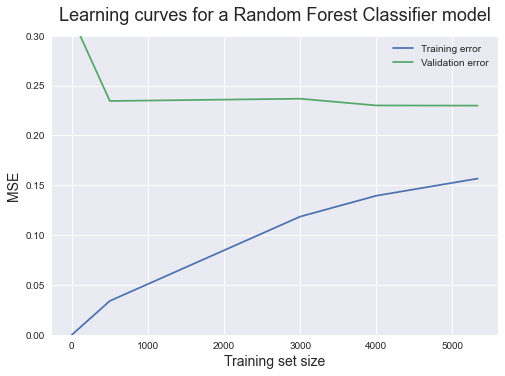

In [176]:
import matplotlib.pyplot as plt

plt.style.use('seaborn')
plt.plot(train_sizes, train_scores_mean, label = 'Training error')
plt.plot(train_sizes, validation_scores_mean, label = 'Validation error')
plt.ylabel('MSE', fontsize = 14)
plt.xlabel('Training set size', fontsize = 14)
plt.title('Learning curves for a Random Forest Classifier model', fontsize = 18, y = 1.03)
plt.legend()
plt.ylim(0,0.3)




**The model is being fitted**

In [177]:
model1.fit(x_train,y_train)

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/forest.py:489: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/tree/tree.py:163: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=350,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [178]:
y_pred=model1.predict(x_test)

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/base.py:158: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



In [179]:
y_pred_train = model1.predict(x_train)
y_pred_test = model1.predict(x_test)

print("- Train set results:")
evaluate(y_train, y_pred_train)
print("- Test set results:")
evaluate(y_test, y_pred_test)

- Train set results:
accuracy: 0.8358835883588359
precision: 0.982532751091703
recall: 0.17110266159695817
f1 score: 0.2914507772020725
- Test set results:
accuracy: 0.7501499700059988
precision: 0.6764705882352942
recall: 0.027218934911242602
f1 score: 0.05233219567690557


/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/base.py:158: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

/Users/benjaminsondberg/anaconda3/lib/python3.7/site-packages/sklearn/ensemble/base.py:158: DeprecationWarning:

`np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check t

**From the accuracy we can actually see the model is performing worse on the test set compared to before.**
**This time with a train accuracy of 0.836 and test accuracy of 0.750.**

**The most important features are investigated.**

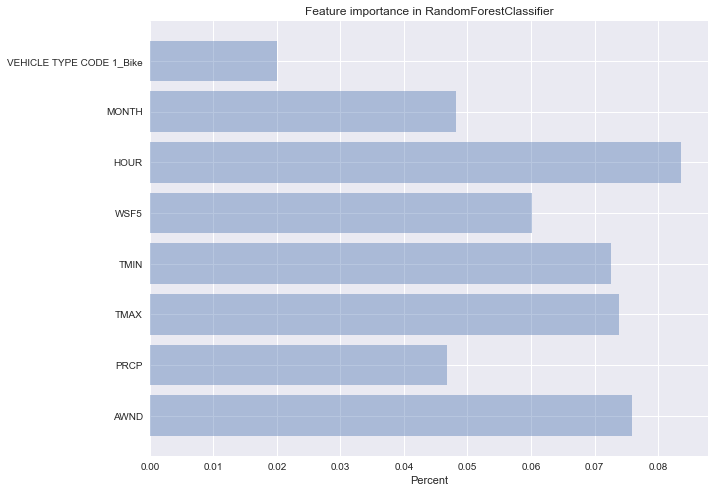

In [180]:
performance_list=model1.feature_importances_
attributes_names=list(x_train.columns)
performance_list2=list(performance_list)

names=[name for name,value in dict(zip(attributes_names,performance_list2)).items() if value>=0.02]
performance=[value for name,value in dict(zip(attributes_names,performance_list2)).items() if value>=0.02]
f,ax = plt.subplots( figsize=(10,8))
y_pos = np.arange(len(names))
plt.barh(y_pos, performance, align='center', alpha=0.4)
plt.yticks(y_pos, names)
plt.xlabel('Percent')
plt.title('Feature importance in RandomForestClassifier')

plt.show()

**Compared to the prediction without weather data we now have some new features that are being the most important. Among these are PRCP, AWND TMAX, TMIN and WSF5. These all describe a condition of the weather. It could be possible that TMIN, TMAX and month are correlated such as WSF5 (which are the strongest windspeed measured for 5 seconds) and AWG (average windspeed)**

**Later on it will therefore be investigated if some kind of dimensionality reduction can be performed as a result of the large number of features.**

In [181]:
confusion_matrix(y_test, y_pred)

array([[2478,   11],
       [ 822,   23]])

**Of course it as before necessary to have a look at confusion matrix to evaluate the performance of the model.**

**The confusion matrix looks much a like the other random forest classifier with hyper parameter tuning. The only difference is now that it predicts that more people are being injured when no injuries are occuring (False negatives).**

## Genre

Which tools did you use from each of the 3 categories of Visual Narrative (Figure 7 in Segal and Heer). Why?

Which tools did you use from each of the 3 categories of Narrative Structure (Figure 7 in Segal and Heer). Why?

Our general idea was to create an annotated graph combined with a slideshow view.

From The visual Narritive we used: 
- Progress bar / Timebar on our heat maps, to give an interactive experience and a consistent viual platform.
- Zooming, specifically on our start map where you can zoom in and out from collisions, also an interactive experience.
- Familiar objects, as the design of each page/slide is the same, not distracting the user from slide to slide.

From the Narritive Structure we used:
- User Directed path, as the user is incentiviced to follow our path, but there is Random Access since the user can choose to explore the website from the last slide to the first.
- Navigation buttons and Hover Highlighting / Details, on the heat maps and the introduction interactive plot. A lot of details in the text about the plots and what to observe.
- Captions / Headlines and Annotations and Introductionary texts, throughout the whole narritive there are examples of this. 

## Visualizations

Explain the visualizations you've chosen.
Why are they right for the story you want to tell?

This follows a structure of map-name and then explanation in the order of the website.

**General Map and Collisions Map**

To begin with on our Home Page we use simple map plots, where it is easy to see the geographical landscape (New York) which is an easy beginning for the user. They should not be overwhelmed by this and they see the divided map into boroughs and where actual collisions has happened.

**Number of serious incidents - bar plot & Collisions by boroughs - bar plot**

Then we chose to get a little more statistical. We create easy to understand bar plots with beautiful colors. This is where the analysis begin on the website. It should be easy to understand the plots as they are rather simple, but they also provide a lot of info. The first bar plot number of collisions as a beginning, and the next bar plot shows the Severe vs Not evere crashes, which is exactly what we want to narrow the analysis down to.

**Contribution Factors plot and Ratio Table**

Then we continue our story and visualization with a plot showing the contributing factors to a crash, which is still simple, but gives a lot of important information in regards to our narritive goal. Furthermore we show specifically which vehicles that has the highest ratio in regards to severe crashes with injuries futher complementing the narritive. 

**Hourly plot of colissions**

**Heat map of hourly occurences**

**Weekly plot of collisions - graph**

**Heat map of weekly occurences**

**Monthly plot of collisions - graph**

**Heat map of monthly occurences**

We keep looking at factors which can increase the risk of collisions, and therefore the next section of plots have the purpose of looking at the time of day, month and year, to tell something about what impact this may have. Both heatplots and graphs are used, making it a little more difficult for the regular user, but as there are multiple plots and some showing the same thing in different ways, it should be manageable.

**Feature Importance Bar Plot & Feature Importance With Weather Bar Plot**

This is where we use our machine learning model in a simple way to further explain causes of accidents to the user. This gives a complex analysis as understandable information to the user, who might not know the Random Forest Clasifier.

**Error plot**

Finally the error plot is a jitter plot, which is put in the "about section", mostly because we fought it was fun and understandable. It does provide insight to the data set about human error which is useful information.

## Discussion 

What went well?,
What is still missing? What could be improved?, Why?

We did a lot of work making the web site look great, with the design being simple and focussing on creating a narritive where the focus and complexity steadily rises, so that it is user friendly. This went well and we are very happy with the web site, but our machine learning model we could have worked more with. It did have a high accuracy but we would have wanted to go more in depth with it creating more exciting visualitions based upon more advanced machine learning. This is also explained in the walk through of our data analysis. One thing we missed, which would have been nice is the SARIMA model. The SARIMA machine learning model takes into considerations seasonalities and peaks in the data which we would have liked to work with as our data subject is highly dependent on time, but we have not been able to make it work due to limited time and the fact that we have no experience with it from anywhere before.

Generally we are happy with the website, but could have put a little more work into the notebook.

## Contributions

All group members contributed equally.... :))

It is true that everyone worked together throughout the project.

Here are some areas where each member takes responsibility

- The Website Creation: Frederik Bjørnstrup

- Plots & Interactive maps: Benjamin Søndberg & Frederik Bjørnstrup

- Machine Learning Model: Benjamin Søndberg & Christian Noes-Rasmussen

- Discussion / Genre / Website structuring : Christian Noes-Rasmussen

